## Import Pretrained Models
Import alexnet net arch and resnet pretrained.

In [1]:
from torchvision import models

In [2]:
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

In [3]:
alexnet = models.AlexNet()

In [4]:
resnet = models.resnet101(pretrained=True)

C:\Users\bassa\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\bassa\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to C:\Users\bassa/.cache\torch\hub\checkpoints\resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

In [5]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Create Image Transformation
Create a preprocess function to transform the source image into a suitable image for `resnet` inference.

In [6]:
from torchvision import transforms
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [10]:
from PIL import Image
img = Image.open("../data/ch2/dog1.jpg")

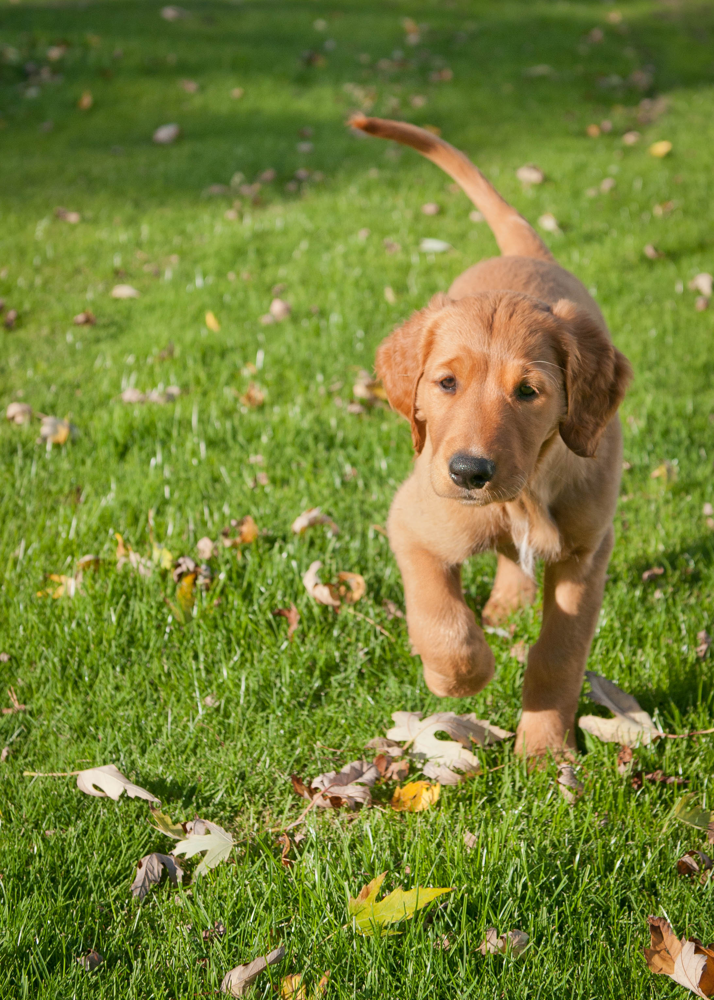

In [13]:
img

In [14]:
img_t = preprocess(img)

In [15]:
img_t

tensor([[[-0.5938, -0.5596, -0.5253,  ...,  0.0569,  0.0569, -0.0458],
         [-0.4911, -0.4397, -0.4397,  ...,  0.0569,  0.0569, -0.0629],
         [-0.4568, -0.4226, -0.4397,  ..., -0.0287, -0.0458, -0.1143],
         ...,
         [-0.4739, -0.9020, -0.7479,  ..., -0.3712, -1.1247, -1.2617],
         [-0.9363, -0.9363, -0.7308,  ..., -0.3198, -1.2959, -0.8335],
         [-1.1760, -0.7479, -0.3027,  ..., -0.5767, -0.6794, -0.5767]],

        [[-0.1450, -0.1099, -0.0924,  ...,  0.5553,  0.5553,  0.4853],
         [-0.0749, -0.0224, -0.0399,  ...,  0.5553,  0.5378,  0.4678],
         [-0.0399, -0.0399, -0.0574,  ...,  0.5028,  0.4678,  0.4153],
         ...,
         [ 0.0126, -0.2675, -0.0574,  ...,  0.0126, -0.7402, -0.9503],
         [-0.3375, -0.2675, -0.0399,  ...,  0.2052, -0.8452, -0.5301],
         [-0.6001, -0.0574,  0.3452,  ..., -0.0749, -0.2325, -0.1800]],

        [[-1.0724, -1.0550, -0.9678,  ..., -0.6541, -0.6715, -0.8458],
         [-0.9853, -0.9156, -0.8807,  ..., -0

In [16]:
import torch
batch_t = torch.unsqueeze(img_t, 0)

In [17]:
batch_t

tensor([[[[-0.5938, -0.5596, -0.5253,  ...,  0.0569,  0.0569, -0.0458],
          [-0.4911, -0.4397, -0.4397,  ...,  0.0569,  0.0569, -0.0629],
          [-0.4568, -0.4226, -0.4397,  ..., -0.0287, -0.0458, -0.1143],
          ...,
          [-0.4739, -0.9020, -0.7479,  ..., -0.3712, -1.1247, -1.2617],
          [-0.9363, -0.9363, -0.7308,  ..., -0.3198, -1.2959, -0.8335],
          [-1.1760, -0.7479, -0.3027,  ..., -0.5767, -0.6794, -0.5767]],

         [[-0.1450, -0.1099, -0.0924,  ...,  0.5553,  0.5553,  0.4853],
          [-0.0749, -0.0224, -0.0399,  ...,  0.5553,  0.5378,  0.4678],
          [-0.0399, -0.0399, -0.0574,  ...,  0.5028,  0.4678,  0.4153],
          ...,
          [ 0.0126, -0.2675, -0.0574,  ...,  0.0126, -0.7402, -0.9503],
          [-0.3375, -0.2675, -0.0399,  ...,  0.2052, -0.8452, -0.5301],
          [-0.6001, -0.0574,  0.3452,  ..., -0.0749, -0.2325, -0.1800]],

         [[-1.0724, -1.0550, -0.9678,  ..., -0.6541, -0.6715, -0.8458],
          [-0.9853, -0.9156, -

## Put Resnet in Evaluation (Inference) Mode

In [18]:
resnet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Inference
Returns a tensor (1-vector) with scores for each of the 1000 categories for classification.

In [20]:
out = resnet(batch_t)
out

tensor([[-1.0181e+00,  2.1083e-01, -2.3774e+00, -2.4000e+00, -2.6477e+00,
         -1.3308e+00, -2.1211e+00, -3.1080e-01,  6.2128e-01, -2.1395e+00,
          7.5447e-01, -4.1282e-01, -6.4600e-01, -5.6568e-01,  4.0763e-01,
         -9.5023e-01, -3.4499e+00,  5.0961e-02,  4.3314e-01, -1.8319e+00,
         -1.5400e+00, -9.3615e-01, -1.7623e+00,  1.3647e-01, -1.5469e+00,
          1.2377e+00,  1.1897e+00,  8.4208e-01,  2.9582e-01,  6.9866e-01,
          3.1741e-01, -1.2136e+00,  8.1701e-01, -9.5263e-01, -1.2753e-01,
         -6.4518e-01,  1.7071e-02, -2.6705e-01,  1.0129e+00,  2.1002e+00,
          1.1683e+00,  1.4852e+00,  2.1063e+00,  1.2719e-01,  9.0941e-02,
         -1.0923e+00,  1.8042e+00,  6.3078e-01, -1.4388e+00, -1.8839e+00,
         -9.1954e-01,  1.0187e-01,  2.2113e+00,  4.5509e-01, -1.2329e+00,
          1.5170e-01, -2.0843e+00, -8.6212e-01, -7.1260e-01,  8.4524e-01,
          5.6933e-01, -1.0684e+00,  1.8118e-01,  3.2275e-01, -4.8756e-01,
         -7.8924e-01, -1.3240e+00, -1.

Load the image classes and find the class with the maximum score.

In [22]:
with open('../data/ch2/imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]

In [29]:
_, index = torch.max(out, 1)
index, index[0]

(tensor([207]), tensor(207))

Using `softmax` transform we can normalize and divide by the sum to get something alike the confidence on the max score. Then we can print the max score category to get a human-readable category.

In [26]:
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
percentage

tensor([1.0071e-04, 3.4417e-04, 2.5864e-05, 2.5287e-05, 1.9739e-05, 7.3662e-05,
        3.3422e-05, 2.0428e-04, 5.1883e-04, 3.2812e-05, 5.9275e-04, 1.8447e-04,
        1.4610e-04, 1.5832e-04, 4.1903e-04, 1.0778e-04, 8.8496e-06, 2.9332e-04,
        4.2985e-04, 4.4628e-05, 5.9755e-05, 1.0931e-04, 4.7845e-05, 3.1950e-04,
        5.9344e-05, 9.6099e-04, 9.1602e-04, 6.4702e-04, 3.7470e-04, 5.6058e-04,
        3.8288e-04, 8.2823e-05, 6.3100e-04, 1.0752e-04, 2.4537e-04, 1.4622e-04,
        2.8355e-04, 2.1342e-04, 7.6758e-04, 2.2767e-03, 8.9658e-04, 1.2309e-03,
        2.2907e-03, 3.1655e-04, 3.0528e-04, 9.3505e-05, 1.6934e-03, 5.2378e-04,
        6.6121e-05, 4.2370e-05, 1.1114e-04, 3.0864e-04, 2.5442e-03, 4.3939e-04,
        8.1242e-05, 3.2441e-04, 3.4673e-05, 1.1771e-04, 1.3669e-04, 6.4907e-04,
        4.9257e-04, 9.5764e-05, 3.3411e-04, 3.8493e-04, 1.7118e-04, 1.2660e-04,
        7.4164e-05, 8.5690e-05, 9.6003e-05, 1.7451e-05, 6.7152e-05, 3.8826e-04,
        1.4182e-05, 8.5941e-05, 1.0662e-

Yay, we changed the pictured from the book, but we got the same result, a **golden retriever** with **91%** confidence.

In [31]:
labels[index[0]], percentage[index[0]].item()

('golden retriever', 91.9332275390625)

## Top-5 Categories
We use `torch.sort()` function to get the top-5 categories from the inference.

In [32]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('golden retriever', 91.9332275390625),
 ('Irish setter, red setter', 1.7372972965240479),
 ('Labrador retriever', 1.4082982540130615),
 ('redbone', 0.6148487329483032),
 ('Rhodesian ridgeback', 0.3253546953201294)]

## Inference, Tabby Cat
Let's try again, but this time with a tabby cat image.

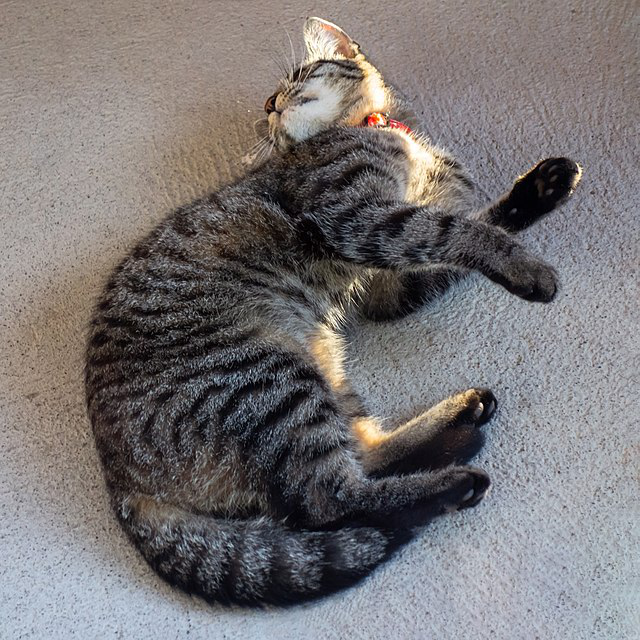

In [37]:
img2 = Image.open("../data/ch2/cat1.jpg")
img2

In [39]:
img_t2 = preprocess(img2)
batch_t2 = torch.unsqueeze(img_t2, 0)
out2 = resnet(batch_t2)
_, indices = torch.sort(out2, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('tabby, tabby cat', 57.85722732543945),
 ('tiger cat', 35.822113037109375),
 ('Egyptian cat', 5.797395706176758),
 ('lynx, catamount', 0.07042257487773895),
 ('space heater', 0.058677006512880325)]

Yeah, nice, a **tabby cat**, definitely not a space heater.

## Inference, Cannon (that throws cannonbals)

### Test 1
First, let's try with a mounted, right-facing cannon.

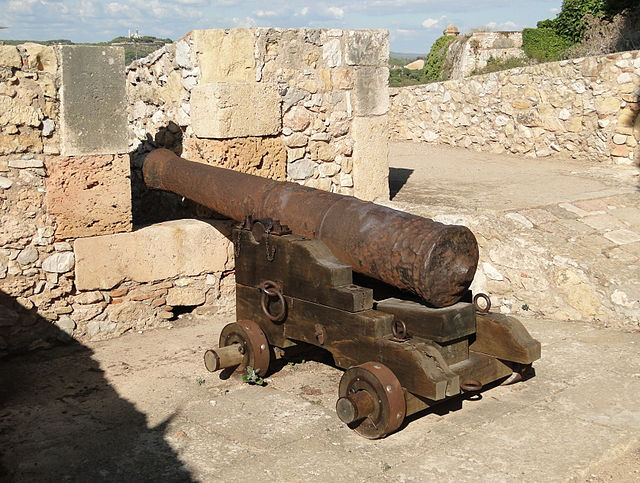

In [56]:
cannon1 = Image.open("../data/ch2/cannon1.jpg")
cannon1

Let's create a function for reuse, to prevent copy-pasta.

In [57]:
def resnet_inference(img):
    img_t = preprocess(img)
    batch_t = torch.unsqueeze(img_t, 0)
    out = resnet(batch_t)
    _, indices = torch.sort(out, descending=True)
    percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
    print([(labels[idx], percentage[idx].item()) for idx in indices[0][:5]])

In [58]:
resnet_inference(cannon1)

[('cannon', 99.98261260986328), ('projectile, missile', 0.007744062691926956), ('tank, army tank, armored combat vehicle, armoured combat vehicle', 0.006462303455919027), ('missile', 0.0019499297486618161), ('mortar', 0.0005460574757307768)]


### Test 2
Let's check with a left-facing cannon..

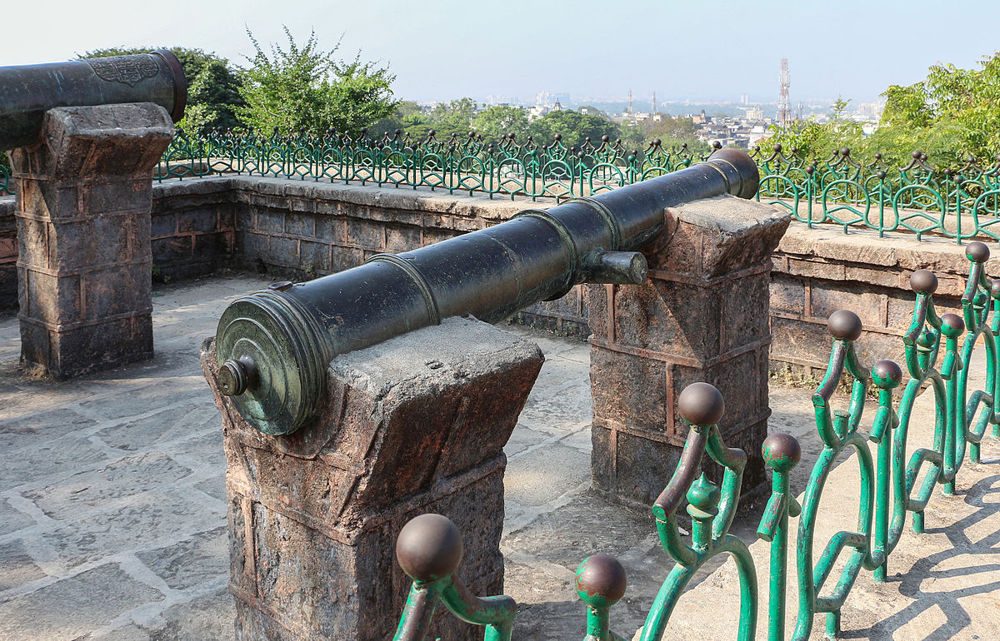

In [54]:
cannon2 = Image.open("../data/ch2/cannon2.jpg")
cannon2

In [55]:
resnet_inference(cannon2)

[('cannon', 86.28792572021484), ('mortar', 13.634490966796875), ('tank, army tank, armored combat vehicle, armoured combat vehicle', 0.01550503820180893), ('projectile, missile', 0.006503875367343426), ('hatchet', 0.005217390600591898)]


### Test 3
Now a drawing of a cannon...

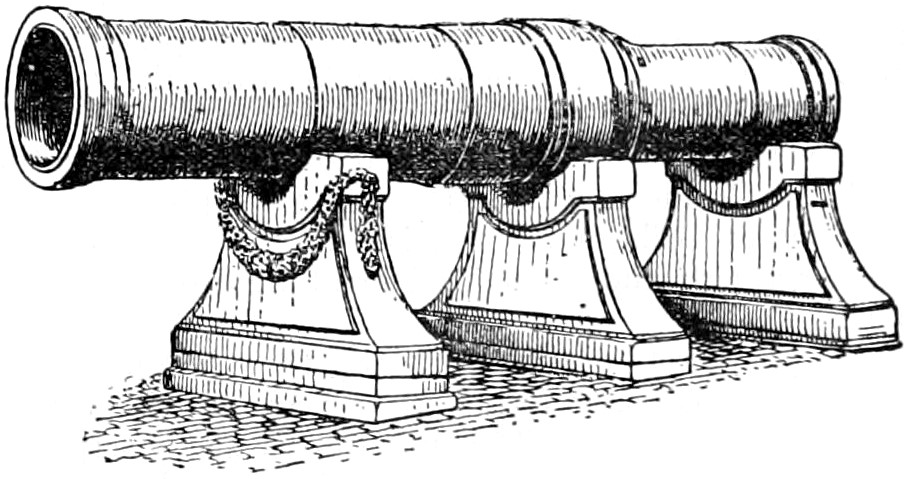

In [52]:
cannon3_drawing = Image.open("../data/ch2/cannon3.jpg")
cannon3_drawing

In [53]:
resnet_inference(cannon3_drawing)

[('electric fan, blower', 25.208065032958984), ('cannon', 14.0596284866333), ('hatchet', 7.886961936950684), ('assault rifle, assault gun', 7.42362117767334), ('typewriter keyboard', 4.188170433044434)]


bruh, I think the lines to simulate contrast on the cannon body, are making the resnet to think this is an electric fan, but the cannon is second option, with 14% confidence. Looks like this network was trained with photographs, not hand-drawn pictures. 

A possible solution to this problem would be to train a network to categorize, hand-drawn images vs photographs, then run resnet if the first network detects this is a photograph. A second solution would be to retrain everything using hand-drawn pictures and photographs.

### Test 4
A cannon firing with lots of people, a more caotic scene...

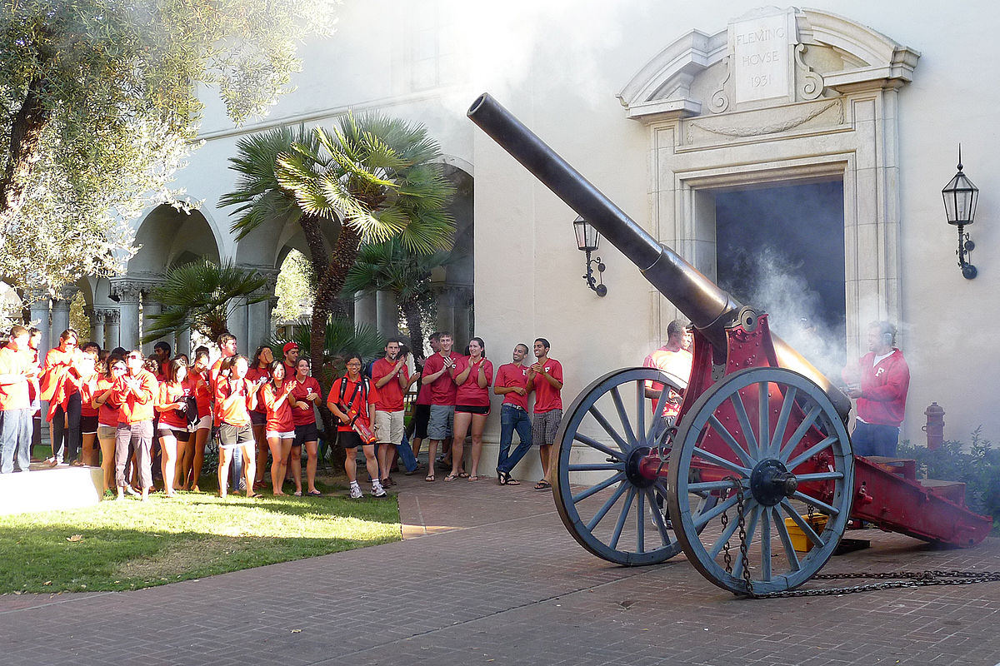

In [59]:
cannon4_firing = Image.open("../data/ch2/cannon4.jpg")
cannon4_firing

In [60]:
resnet_inference(cannon4_firing)

[('cannon', 99.9954833984375), ('mortar', 0.0016851350665092468), ('thresher, thrasher, threshing machine', 0.0005571695510298014), ('projectile, missile', 0.00045959409908391535), ('bearskin, busby, shako', 0.00043560913763940334)]


Yay! It works.